# First Innings Score Prediction 


**Indian Premier League (IPL), Indian professional Twenty20 (T20) cricket league established in 2008. The league, which is based on a round-robin group and knockout format, has teams in major Indian cities.**

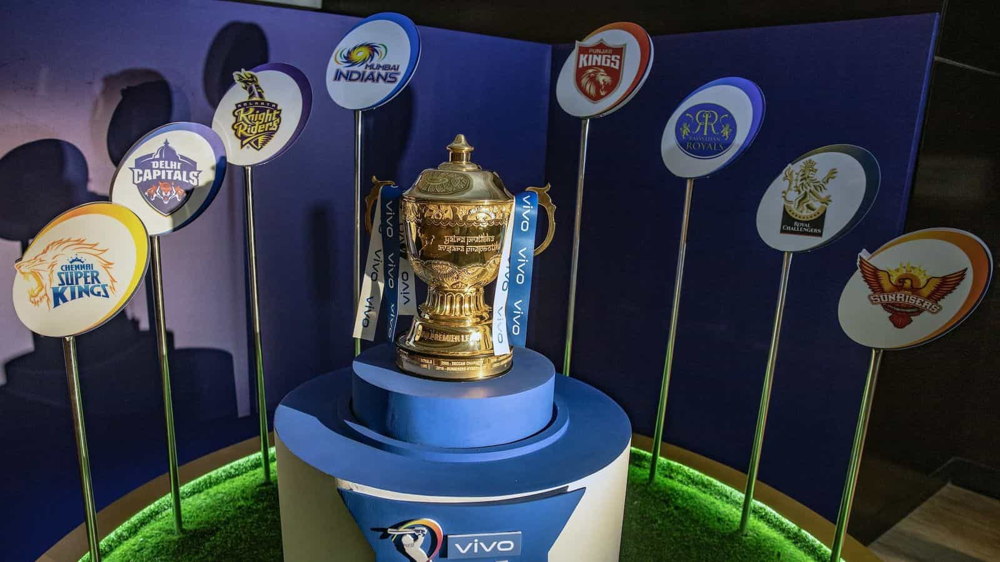

In [120]:
#Importing Essential libraries
import pandas as pd
import pickle
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib
import json
import time
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9,5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
import scipy.stats as stats
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge,Lasso
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics 
from sklearn.metrics import mean_absolute_error as mae
from sklearn.preprocessing import  MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor
import warnings
warnings.filterwarnings('ignore')

**Loading the Datasets**

In [121]:
ipl_df = pd.read_csv('ipl.csv')

In [122]:
ipl_df.head(2)

,id,inning,over,ball,total_runs,is_wicket,batting_team,bowling_team,final_total_runs,wickets,runs,last_5_over_wickets,last_5_over_runs,last_5_over_balls,venue,winner
0,335982,1,0.1,1,1,0,Kolkata Knight Riders,Royal Challengers Bangalore,222,0,1,0,1,1,M Chinnaswamy Stadium,Kolkata Knight Riders
1,335982,1,0.2,2,0,0,Kolkata Knight Riders,Royal Challengers Bangalore,222,0,1,0,1,2,M Chinnaswamy Stadium,Kolkata Knight Riders


In [123]:
# here some of the teams name changed in year 2021 is 
# Delhi Daredevils becames Delhi Capitals
# Kings XI Punjab becames Punjab Kings

# let's rename this teams with current name

ipl_df.replace({"Delhi Daredevils": "Delhi Capitals", "Kings XI Punjab": "Punjab Kings"}, inplace=True)

In [124]:
ipl_df.shape

(193096, 16)

In [125]:
ipl_df.isna().sum()

id                     0
inning                 0
over                   0
ball                   0
total_runs             0
is_wicket              0
batting_team           0
bowling_team           0
final_total_runs       0
wickets                0
runs                   0
last_5_over_wickets    0
last_5_over_runs       0
last_5_over_balls      0
venue                  0
winner                 0
dtype: int64

It is good that we have no missing values ,therefore it saves a lot of time ...Now we go for further EDA process

# EDA

In [126]:
df = ipl_df.copy()

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193096 entries, 0 to 193095
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   193096 non-null  int64  
 1   inning               193096 non-null  int64  
 2   over                 193096 non-null  float64
 3   ball                 193096 non-null  int64  
 4   total_runs           193096 non-null  int64  
 5   is_wicket            193096 non-null  int64  
 6   batting_team         193096 non-null  object 
 7   bowling_team         193096 non-null  object 
 8   final_total_runs     193096 non-null  int64  
 9   wickets              193096 non-null  int64  
 10  runs                 193096 non-null  int64  
 11  last_5_over_wickets  193096 non-null  int64  
 12  last_5_over_runs     193096 non-null  int64  
 13  last_5_over_balls    193096 non-null  int64  
 14  venue                193096 non-null  object 
 15  winner           

In [128]:
df.describe()

,id,inning,over,ball,total_runs,is_wicket,final_total_runs,wickets,runs,last_5_over_wickets,last_5_over_runs,last_5_over_balls
count,1.930960e+05,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000,193096.000000
mean,7.566432e+05,1.482920,9.541958,60.617294,1.306324,0.049053,156.979953,2.423416,74.169211,2.401510,73.630267,59.879966
std,3.062687e+05,0.499709,5.677675,35.178614,1.598526,0.215980,29.502786,2.068787,47.892619,2.058794,47.658659,34.847710
min,3.359820e+05,1.000000,0.100000,1.000000,0.000000,0.000000,44.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,5.012270e+05,1.000000,4.500000,30.000000,0.000000,0.000000,138.000000,1.000000,34.000000,1.000000,34.000000,30.000000
50%,7.292950e+05,1.000000,9.400000,60.000000,1.000000,0.000000,158.000000,2.000000,70.000000,2.000000,69.000000,59.000000
75%,1.082628e+06,2.000000,14.400000,90.000000,1.000000,0.000000,177.000000,4.000000,109.000000,4.000000,109.000000,89.000000
max,1.237181e+06,2.000000,19.900000,134.000000,7.000000,1.000000,263.000000,10.000000,263.000000,10.000000,263.000000,133.000000


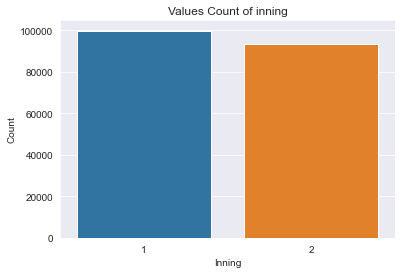

In [129]:
# let's findout the total counts of inning

sns.countplot(df.inning)
plt.title("Values Count of inning")
plt.xlabel("Inning")
plt.ylabel("Count")
plt.show()

Text(0, 0.5, 'Count')

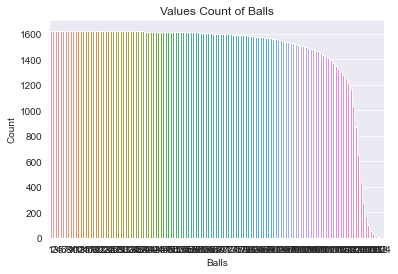

In [130]:
sns.countplot(df.ball)
plt.title("Values Count of Balls")
plt.xlabel("Balls")
plt.ylabel("Count")

**As we know that there are 6 balls in 1 over**
**there are rarely more than 8 balls**

<AxesSubplot:xlabel='total_runs', ylabel='Density'>

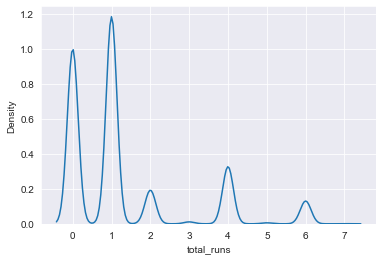

In [132]:
sns.kdeplot(df.total_runs)

In [133]:
top_team = df.batting_team.value_counts().head(15)
top_team

Mumbai Indians                 24466
Punjab Kings                   22622
Delhi Capitals                 22602
Kolkata Knight Riders          22554
Royal Challengers Bangalore    22540
Chennai Super Kings            21455
Rajasthan Royals               18934
Sunrisers Hyderabad            14826
Deccan Chargers                 9034
Pune Warriors                   5443
Gujarat Lions                   3558
Rising Pune Supergiant          1900
Kochi Tuskers Kerala            1582
Rising Pune Supergiants         1580
Name: batting_team, dtype: int64

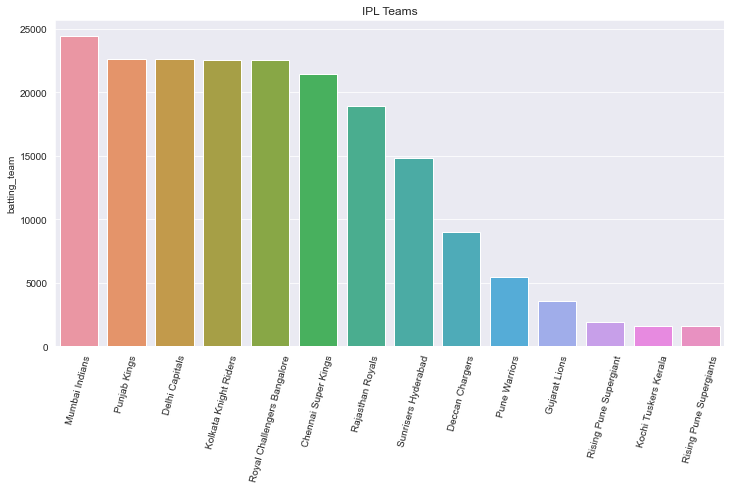

In [134]:
plt.figure(figsize=(12,6))
plt.xticks(rotation=75)
plt.title('IPL Teams')
sns.barplot(x=top_team.index,y=top_team);

# Correlation 

In [20]:


if isinstance(df, (pd.DatetimeIndex, pd.MultiIndex)):
    df = df.to_frame(index=False)

# remove any pre-existing indices for ease of use in the D-Tale code, but this is not required
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

corr_cols = ['id', 'inning', 'over', 'ball', 'total_runs', 'is_wicket', 'final_total_runs', 'wickets','runs', 'last_5_over_wickets', 'last_5_over_runs', 'last_5_over_balls']
corr_data = df[corr_cols]
corr_data = np.corrcoef(corr_data.values, rowvar=False)
corr_data = pd.DataFrame(corr_data, columns=[corr_cols], index=[corr_cols])
corr_data.index.name = str('column')
corr_data = corr_data.reset_index()

In [21]:
corr_data

,level_0,id,inning,over,ball,total_runs,is_wicket,final_total_runs,wickets,runs,last_5_over_wickets,last_5_over_runs,last_5_over_balls
0,id,1.000000,0.000394,0.008078,0.002473,0.024527,-0.003006,0.168598,-0.020999,0.054846,-0.019204,0.054875,0.002434
1,inning,0.000394,1.000000,-0.046875,-0.045794,-0.007344,-0.000874,-0.198301,0.013663,-0.035676,0.013683,-0.035553,-0.045965
2,over,0.008078,-0.046875,1.000000,0.998793,0.087635,0.074105,0.060691,0.752685,0.938639,0.751602,0.938190,0.998737
3,ball,0.002473,-0.045794,0.998793,1.000000,0.087692,0.074035,0.062247,0.752492,0.939973,0.751344,0.939517,0.999966
4,total_runs,0.024527,-0.007344,0.087635,0.087692,1.000000,-0.180084,0.122958,-0.011620,0.139433,-0.011247,0.139894,0.088034
5,is_wicket,-0.003006,-0.000874,0.074105,0.074035,-0.180084,1.000000,-0.039668,0.166246,0.066121,0.166768,0.066231,0.074345
6,final_total_runs,0.168598,-0.198301,0.060691,0.062247,0.122958,-0.039668,1.000000,-0.211268,0.263945,-0.208678,0.264440,0.062405
7,wickets,-0.020999,0.013663,0.752685,0.752492,-0.011620,0.166246,-0.211268,1.000000,0.607424,0.997496,0.606817,0.752913
8,runs,0.054846,-0.035676,0.938639,0.939973,0.139433,0.066121,0.263945,0.607424,1.000000,0.607318,0.999752,0.940087
9,last_5_over_wickets,-0.019204,0.013683,0.751602,0.751344,-0.011247,0.166768,-0.208678,0.997496,0.607318,1.000000,0.606572,0.751801


In [ ]:
main_data.groupby(["id", "inning"]).is_wicket.sum().reset_index()

In [33]:
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([df['over'],df['runs'],], axis=1)
chart_data = chart_data.sort_values(['over'])
chart_data = chart_data.rename(columns={'over': 'x'})
chart_data = chart_data.dropna()

import plotly.graph_objs as go

chart = go.Scattergl(x=chart_data['x'], y=chart_data['runs'], mode='markers', opacity=0.7, name='all',marker={'size': 15, 'line': {'width': 0.5, 'color': 'white'}}
)

figure = go.Figure(data=[chart], layout=go.Layout({
    'legend': {'orientation': 'h'},
    'title': {'text': 'runs by over'},
    'xaxis': {'title': {'text': 'over'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'runs'}, 'type': 'linear'}
}))



In [32]:
figure

In [35]:
df = df.reset_index().drop('index', axis=1, errors='ignore')
df.columns = [str(c) for c in df.columns]  # update columns to strings in case they are numbers

chart_data = pd.concat([df['over'],df['wickets'],], axis=1)
chart_data = chart_data.sort_values(['over'])
chart_data = chart_data.rename(columns={'over': 'x'})
chart_data = chart_data.dropna()

import plotly.graph_objs as go

chart = go.Scattergl(x=chart_data['x'], y=chart_data['wickets'], mode='markers', opacity=0.7, name='all',marker={'size': 15, 'line': {'width': 0.5, 'color': 'white'}}
)

figure = go.Figure(data=[chart], layout=go.Layout({
    'legend': {'orientation': 'h'},
    'title': {'text': 'wickets by over'},
    'xaxis': {'title': {'text': 'over'}},
    'yaxis': {'tickformat': '0:g', 'title': {'text': 'wickets'}, 'type': 'linear'}
}))



In [36]:
figure

First one show scatter plot between Over and runs score in per over.Second one show the relation between over and wicket per over.

# Q-Q Plot

In [22]:
def qq_plot(df,variable):
    plt.figure(figsize=(10,6))
    plt.subplot(1,2,1)
    df[variable].hist()
    '''rng = np.arange(df.runs.min(),df.runs.max(),0.1)
    plt.plot(rng,norm.pdf(rng,df.runs.mean(),df.runs.std()))'''
    
    plt.subplot(1,2,2)
    stats.probplot(df[variable],dist='norm',plot=plt)
    plt.show()

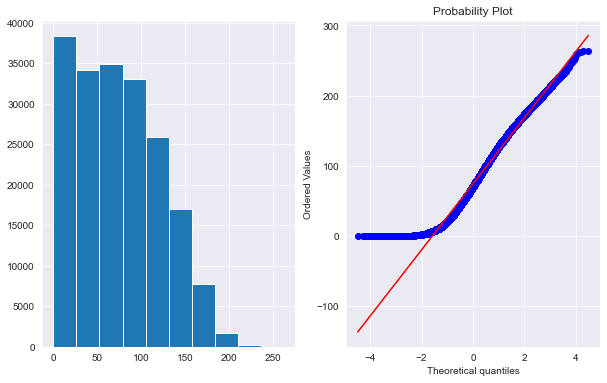

In [37]:
qq_plot(df,'runs')

In [38]:
# only taking more than 5 over records of match

df = df.loc[df.over >= 5]

In [39]:
df.shape

(142375, 16)

In [41]:
#keeping only consistent teams
consistent_teams = ['Kolkata Knight Riders', 'Chennai Super Kings', 'Rajasthan Royals',
                    'Mumbai Indians', 'Punjab Kings', 'Royal Challengers Bangalore',
                    'Delhi Capitals', 'Sunrisers Hyderabad'] 

In [42]:
# let's drop only those teams data which are not in year 2021

df = df[(df['batting_team'].isin(consistent_teams)) & (df['bowling_team'].isin(consistent_teams))]

In [43]:
df.shape

(110058, 16)

Let's verifying 2021 teams with batting_team, bowling_team and winner¶

In [46]:
df.batting_team.nunique(),df.bowling_team.nunique(),df.winner.nunique()

(8, 8, 8)

# Feature Encoding

In [47]:
# here i'm going to do label encoding base on counting of highest winning team
# here i'm ordering team base on winning count and making dict using team name as key and encoded values

encoded_teams = {k:v for v, k in enumerate(df.winner.value_counts().sort_values().index, 0)}
encoded_teams

{'Sunrisers Hyderabad': 0,
 'Delhi Capitals': 1,
 'Rajasthan Royals': 2,
 'Royal Challengers Bangalore': 3,
 'Punjab Kings': 4,
 'Kolkata Knight Riders': 5,
 'Chennai Super Kings': 6,
 'Mumbai Indians': 7}

In [48]:
# let's create a new data frame and map this encoded values with batting and bowling teams

df1= df.copy()


df1.batting_team = df1.batting_team.map(encoded_teams)
df1.bowling_team = df1.bowling_team.map(encoded_teams)

In [50]:
df1.head(2)

,id,inning,over,ball,total_runs,is_wicket,batting_team,bowling_team,final_total_runs,wickets,runs,last_5_over_wickets,last_5_over_runs,last_5_over_balls,venue,winner
32,335982,1,5.1,33,1,0,5,3,222,0,61,0,60,32,M Chinnaswamy Stadium,Kolkata Knight Riders
33,335982,1,5.2,34,0,1,5,3,222,1,61,1,60,33,M Chinnaswamy Stadium,Kolkata Knight Riders


In [51]:
# here i'm doing one hot encoding for veune
encoded_venue = pd.get_dummies(df1.venue, drop_first=True)

In [63]:
len(encoded_venue.columns)

29

#  Feature Selection

In [52]:
df2 = df1[["over", "wickets", "runs", "last_5_over_wickets", "last_5_over_runs","batting_team", "bowling_team", "final_total_runs"]].copy()


df2.head()

,over,wickets,runs,last_5_over_wickets,last_5_over_runs,batting_team,bowling_team,final_total_runs
32,5.1,0,61,0,60,5,3,222
33,5.2,1,61,1,60,5,3,222
34,5.3,1,61,1,60,5,3,222
35,5.4,1,61,1,60,5,3,222
36,5.5,1,61,1,60,5,3,222


In [53]:
# here in df2 i don't have venue column for that i'm concatenate encoded_venue dataframe with df2

df2 = pd.concat([df2, encoded_venue], axis=1).copy()
df2.sample(3)

,over,wickets,runs,last_5_over_wickets,last_5_over_runs,batting_team,bowling_team,final_total_runs,Brabourne Stadium,Buffalo Park,...,"Rajiv Gandhi International Stadium, Uppal","Sardar Patel Stadium, Motera",Sawai Mansingh Stadium,Shaheed Veer Narayan Singh International Stadium,Sharjah Cricket Stadium,Sheikh Zayed Stadium,St George's Park,Subrata Roy Sahara Stadium,SuperSport Park,Wankhede Stadium
166517,16.6,2,163,2,162,4,7,177,0,0,...,0,0,0,0,0,0,0,0,0,0
108290,9.4,0,107,0,106,4,6,226,0,0,...,0,0,0,0,0,0,0,0,0,1
32445,5.3,2,58,2,56,1,3,183,0,0,...,0,0,0,0,0,0,0,0,0,0


# Model Building

In [54]:
# here let's creat feature matrix X and target vector y

X = df2.drop(columns="final_total_runs") # 38 features
y = df2.final_total_runs

In [55]:
# let's split the data into train and test part

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

(X_train.shape, y_train.shape), (X_test.shape, y_test.shape)

(((88046, 36), (88046,)), ((22012, 36), (22012,)))

In [56]:
#Scaling the data is important
scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [113]:
X_train[1].shape

(36,)

Executing shutdown due to inactivity...


2021-10-05 02:49:09,766 - INFO     - Executing shutdown due to inactivity...


Executing shutdown...


2021-10-05 02:49:13,878 - INFO     - Executing shutdown...


# Hyperparameter Tunnings

In [73]:

algo1 = {
    "Linear Regression": {
        "model": LinearRegression(),
        "params": {}
    },
    "Ridge": {
        "model": Ridge(),
        "params": {
            "alpha":np.arange(0.1, 1, 0.01)
        }
    },
    "Lasso": {
        "model": Lasso(),
        "params": {
            "alpha": np.arange(0.1, 1, 0.01)
        }
    
    }
}

In [80]:
algo2 = {
    "Decision Tree": {
        "model": DecisionTreeRegressor(),
        "params": {
            "criterion": ["mse", "friedman_mse"],
            "splitter": ["best", "random"],
            "max_depth": [1, 3, 5, 7, 9, 10, 11, 12, 14, 15, 18, 20, 25, 28, 30, 33, 38, 40],
            "min_samples_split": [2, 4, 6, 8, 10, 15, 20],
            "min_samples_leaf": [i for i in range(1, 11)],
            "max_leaf_nodes": [None] + [i for i in range(10, 91, 10)],
            "max_features": ["auto", "log2", "sqrt", None]            
        }
    }
}

In [87]:
algo3 = {
    "Random Forest": {
        "model": RandomForestRegressor(),
        "params": {
            "n_estimators": [100, 200, 300],
            "criterion": ["mse", "friedman_mse"],
            "max_depth": [1, 3, 5, 7, 9, 10, 11, 12, 14, 15, 18, 20, 25, 28, 30, 33, 38, 40],
            "min_samples_split": [2, 4, 6, 8, 10, 15, 20],
            "min_samples_leaf": [i for i in range(1, 11)],
            "max_leaf_nodes": [None] + [i for i in range(10, 91, 10)],
            "max_features": ["auto", "log2", "sqrt", None]
        }
    }
}

In [96]:
algo4 = {
    "Ada Boost": {
        "model": AdaBoostRegressor(),
        "params": {
            "n_estimators": [100, 200, 300],
            "learning_rate": np.arange(0.1, 1, 0.01),
            "loss": ['linear', 'square', 'exponential']
        }
    }
}

In [114]:
start_time = time.time()
best_model = {}
best_model_details = []

for model_name, values in algo3.items():
    rscv = RandomizedSearchCV(values["model"], values["params"], cv=5, n_iter=15, n_jobs=-1, verbose=2, random_state=4)
    rscv.fit(X_train, y_train)
    print("---fitted---")
    best_model[model_name] = rscv
    best_model_details.append({"Model Name": model_name, "Best Score": rscv.best_score_, "Best Parameters": rscv.best_params_})
    print(model_name)


print("--------------------------------------------------------")
print(f"it takes {(time.time() - start_time) / 60} minutes")
print("--------------------------------------------------------")

Fitting 5 folds for each of 15 candidates, totalling 75 fits
---fitted---
Ada Boost
--------------------------------------------------------
it takes 11.13373509645462 minutes
--------------------------------------------------------


In [115]:
pd.set_option('display.max_colwidth', None)
pd.DataFrame(best_model_details)

,Model Name,Best Score,Best Parameters
0,Ada Boost,0.402948,"{'n_estimators': 300, 'loss': 'linear', 'learning_rate': 0.30999999999999994}"


In [116]:
test_model = []

for model_name, model in best_model.items():
    test_model.append({"Model Name": model_name, "Test Score": model.score(X_test, y_test)})

pd.DataFrame(test_model)

,Model Name,Test Score
0,Ada Boost,0.417547


In [117]:
# let's calculate error using MSE, RMSE and MAE for Gradient Boost algorithm

from sklearn.metrics import mean_absolute_error, mean_squared_error

train_model_error = []
test_model_error = []

for model_name, model in best_model.items():
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_mse = mean_squared_error(y_train, y_pred_train)
    train_rmse = np.sqrt(train_mse)

    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_mse = mean_squared_error(y_test, y_pred_test)
    test_rmse = np.sqrt(test_mse)
    
    train_model_error.append({"Model Name": model_name, "Mean Absolute Error": train_mae, "Mean Squared Error": train_mse, "Root Mean Squared Error": train_rmse})
    test_model_error.append({"Model Name": model_name, "Mean Absolute Error": test_mae, "Mean Squared Error": test_mse, "Root Mean Squared Error": test_rmse})
    

train_model_error = pd.DataFrame(train_model_error)
test_model_error = pd.DataFrame(test_model_error)

In [118]:
print("-------- Training Data Error --------")
train_model_error

-------- Training Data Error --------


,Model Name,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,Ada Boost,17.563531,510.913785,22.603402


In [119]:
print("-------- Test Data Error --------")
test_model_error

-------- Test Data Error --------


,Model Name,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,Ada Boost,17.511724,509.959966,22.582293


### Model Selection

Random Forest algorithm gives 0.672894 r2_score & 11.258473 on train dataset and 0.692461 r2_score & 11.999111 on test dataset

Difference of train dataset MAE and test dataset MAE is 0.740638 for Random Forest

if i select Radom Forest algorithm which has low r2_score but it will perfrom stable as it performed on train dataset because MAE difference between train and test dataset is low

I'm selecting **Random Forest** as final model

### Exporting the files ,Models and Scaler

In [59]:
with open("encodedteams.json", "w") as f:
    json.dump(encoded_teams, f)

In [107]:
venue = {}
j=0
for i in encoded_venue.columns:
    venue[i] = j
    j+=1

In [108]:
venue

{'Brabourne Stadium': 0,
 'Buffalo Park': 1,
 'De Beers Diamond Oval': 2,
 'Dr DY Patil Sports Academy': 3,
 'Dr. Y.S. Rajasekhara Reddy ACA-VDCA Cricket Stadium': 4,
 'Dubai International Cricket Stadium': 5,
 'Eden Gardens': 6,
 'Feroz Shah Kotla': 7,
 'Himachal Pradesh Cricket Association Stadium': 8,
 'Holkar Cricket Stadium': 9,
 'JSCA International Stadium Complex': 10,
 'Kingsmead': 11,
 'M Chinnaswamy Stadium': 12,
 'MA Chidambaram Stadium, Chepauk': 13,
 'Maharashtra Cricket Association Stadium': 14,
 'New Wanderers Stadium': 15,
 'Newlands': 16,
 'OUTsurance Oval': 17,
 'Punjab Cricket Association Stadium, Mohali': 18,
 'Rajiv Gandhi International Stadium, Uppal': 19,
 'Sardar Patel Stadium, Motera': 20,
 'Sawai Mansingh Stadium': 21,
 'Shaheed Veer Narayan Singh International Stadium': 22,
 'Sharjah Cricket Stadium': 23,
 'Sheikh Zayed Stadium': 24,
 "St George's Park": 25,
 'Subrata Roy Sahara Stadium': 26,
 'SuperSport Park': 27,
 'Wankhede Stadium': 28}

In [109]:
with open("venues.json", "w") as f:
    json.dump(venue, f)

In [95]:
with open("scaler.pickle", "wb") as f:
    pickle.dump(scaler, f)

In [94]:
with open("model-Random.pkl", "wb") as f:
    pickle.dump(best_model["Random Forest"], f) 